In [1]:
#Import necessary packages igraph, scvelo, scanpy, anndata, pandas, os, numpy
!pip install -U scvelo
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:90% !important; }</style>"))
%matplotlib inline

import scvelo as scv
scv.logging.print_version()

#test whether igraph is imported
import igraph as ig

import loompy
import numpy as np
import scanpy as sc
import anndata
import pandas as pd
import os
import louvain
cwd = os.getcwd()
cwd

Requirement already up-to-date: scvelo in /usr/local/lib/python3.7/site-packages (0.1.25)


Running scvelo 0.1.25 (python 3.7.7) on 2020-05-12 12:28.


'/Users/whippoorwill/Desktop/Jupyter'

Combine 4 loom files into 1


In [2]:
files=['LD5LD.loom','LD5RC.loom','LD7LD.loom','LD7RC.loom']
newfile='mgAVM02.loom'
loompy.combine(files,newfile,key="Accession")

Import the data file from inside the Jupyter folder as "adata"

In [3]:
adata = scv.read(filename="mgAVM02/mgAVM02.loom",cache=True)

Variable names are not unique. To make them unique, call `.var_names_make_unique`.


If you get a message that "variable names are not unique", run the first line (make_unique). Also set verbosity and figure params for good visualization. 

In [4]:
adata.var_names_make_unique()
scv.settings.verbosity = 4  # show errors(0), warnings(1), info(2) and hints(3)
scv.settings.set_figure_params('scvelo')  # for beautified visualization

In [5]:
# show proportions of spliced/unspliced abundances
scv.utils.show_proportions(adata)
adata

Abundance of ['spliced', 'unspliced', 'ambiguous']: [0.5  0.44 0.06]


AnnData object with n_obs × n_vars = 35259 × 31053 
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand'
    layers: 'ambiguous', 'matrix', 'spliced', 'unspliced'

Open a file containing the names of the subset of cells that you want to use, if you need the cells subsetted. I will only use the mg subset (from R). 

In [6]:
#l = open(file="mgAVM02_names.csv",mode = 'r') #read (r) a file as the object "l"
#l = l.readlines()
#type(l)
#Import each line into the object 'l'
#print(l[1])
#print(adata.var_names[1])
#print (adata.obs_names[1])

In [7]:
anno = pd.read_table("mgAVM02/mgAVM02_metadata.csv",header=0, sep=",")
#print(anno[1:5][1:5])
print(anno['finalclusters'][1])
print(type(anno['finalclusters'][1]))

#make clusters into strings
clusterstring = []
for cluster in anno['finalclusters']:
    cluster = str(cluster)
    clusterstring.append(cluster)

anno['finalclusters'] = clusterstring
    
print(type(anno['finalclusters'][1]))
print(anno['finalclusters'][1])
l = anno['Cellname']
print(l[1])

6
<class 'numpy.int64'>
<class 'str'>
6
AAACCCAGTGCCTTTC-LD5RC


In [8]:
len(l)

12330

In [9]:


#l = anno['Cellname']
#print(l[1])

umap = pd.read_csv("mgAVM02/umap_mgAVM02_may2020.csv")
print(umap[0:2][1:5])

pca = pd.read_csv("mgAVM02/pca_mgAVM02_may2020.csv")
print(pca[0:2][1:5])

#sample_one_index = pd.DataFrame(sample_one.obs.index)
#sample_one = sample_one_index.rename(columns = {0:'Cell ID'}
#umap_ordered = sample_one_index.merge(umap,on="Cell ID")
#umap_ordered = umap_ordered.iloc[:,1:]
#sample_one.obsm['X_umap'] = umap_ordered.values

                 Cellname    UMAP_1    UMAP_2
1  AAACCCAGTGCCTTTC-LD5RC -2.765974 -4.103992
               Unnamed: 0      PC_1      PC_2      PC_3      PC_4     PC_5  \
1  AAACCCAGTGCCTTTC-LD5RC  3.275602  4.461289  7.586133 -6.739693  0.06975   

       PC_6     PC_7      PC_8      PC_9  ...     PC_41     PC_42     PC_43  \
1  0.653693 -3.68008  1.513936  1.267235  ...  0.246318 -0.679166 -1.406315   

      PC_44     PC_45     PC_46     PC_47     PC_48     PC_49     PC_50  
1  1.218816 -1.305545  0.485362 -0.517826  1.121005 -1.174949 -0.104246  

[1 rows x 51 columns]


Each line is formatted differently from the cellnames in the loom file, which is: LD5LD:---------x. The metadata is ---------- - LD5RC. Additionally, each line is imported with a trailing 'n'.

In [10]:
#n = [i.replace('\n','') for i in l] #initialize a new object 'n' that contains each line of 'l' without the trailing \n
#n[0] #read the second line to verify that this worked

In [11]:
l = list(l)
print(type(l))
l[1]
a = list(umap['Cellname'])
a == l #Check that the cells are in the same order

<class 'list'>


True

In [12]:
#Now split each line and move the elements around to format the metadata in the same way as the loom object
j=0
for i in l:
    x = i.split("-")
    a = x[1]+":"+x[0]+"x"
    l[j] = a
    j=j+1

In [13]:
anno.index = l
umap.index = l
pca.index = l

#sample_one_index = pd.DataFrame(sample_one.obs.index)
#sample_one = sample_one_index.rename(columns = {0:'Cell ID'}
#umap_ordered = sample_one_index.merge(umap,on="Cell ID")
#umap_ordered = umap_ordered.iloc[:,1:]
#sample_one.obsm['X_umap'] = umap_ordered.values

Now subset the adata object including on the cells that are in the metadata file (n). 

In [14]:
adata_subset = adata[l,:]

In [15]:
genes = adata_subset.var_names #get the names of each gene in the analysis

print(np.where(genes=='Xist'))
print(np.where(genes=='Eif2s3y'))
print(np.where(genes=='Ddx3y'))
print(np.where(genes=='Uty'))
print(np.where(genes=='Tsix')) #find Xist and remove it [later] to avoid using Xist to drive all the clustering, given that its expression is very different in mcherry high (female only)
print(genes[29562]) #verify the location of Xist
len(genes) #initial length of the gene list

(array([29562]),)
(array([30665]),)
(array([30325]),)
(array([30324]),)
(array([30117]),)
Xist


31053

In [16]:
type(genes)
genesneg = genes.drop(['Xist','Eif2s3y','Ddx3y','Uty','Tsix']) #remove Xist+related genes from the gene list
print(len(genes))
print(len(genesneg))

31053
31048


In [17]:
adata_subset = adata_subset[:,genesneg] #subset the data again, this time removing Xist
adata = adata_subset
adata #check whether the number of cells and genes is correct now

View of AnnData object with n_obs × n_vars = 12330 × 31048 
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand'
    layers: 'ambiguous', 'matrix', 'spliced', 'unspliced'

Now write a file (cellnames.txt) with all the cellnames. This is strictly unnecessary but can be used to check against Seurat cellnames. 

In [18]:
print(adata.var_names[1])
print (adata.obs_names[1])
#with open('cellnames.txt','w') as f:
    #for item in adata.obs_names:
        #f.write("%s\n"%item)

#Check that the lists are ordered correctly
anno.index.all() == adata.obs_names.all()

Gm37381
LD5RC:AAACCCAGTGCCTTTCx


True

In [19]:
print(type(anno))
anno[['finalclusters','Cellname']][1:5]

<class 'pandas.core.frame.DataFrame'>


,finalclusters,Cellname
LD5RC:AAACCCAGTGCCTTTCx,6,AAACCCAGTGCCTTTC-LD5RC
LD5RC:AAACGAAAGGTGGGTTx,5,AAACGAAAGGTGGGTT-LD5RC
LD5RC:AAACGAACAACAAGATx,5,AAACGAACAACAAGAT-LD5RC
LD5RC:AAACGAAGTAGCTGTTx,5,AAACGAAGTAGCTGTT-LD5RC


In [20]:
print (adata.obs_keys) #find out whether there is any annotation yet in adata

<bound method AnnData.obs_keys of View of AnnData object with n_obs × n_vars = 12330 × 31048 
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand'
    layers: 'ambiguous', 'matrix', 'spliced', 'unspliced'>


Add in metadata from the text file; needs to be separated by commas and you can use the headings in that file to pull out a column

In [21]:
adata.obs[['nCount_RNA','percent.mito','age','condition','finalclusters','sample_description','sex']] = anno[['nCount_RNA','percent.mito','age','condition','finalclusters','sample_description','sex']]

Trying to set attribute `.obs` of view, making a copy.


In [22]:
#Remove the cellnames column from umap and pca
umap = umap[['UMAP_1','UMAP_2']]
pca = pca.iloc[:,1:31]
umap2 = umap.to_numpy()
pca2 = pca.to_numpy()
print(type(umap2))
print(type(pca2))
print(umap2)
print(pca2)
adata.obsm['X_umap'] = umap2
adata.obsm['X_pca'] = pca2
adata #check whether attributes have been added

<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
[[-4.66154099  2.23746363]
 [-2.76597405 -4.10399183]
 [-5.11898184  1.14089123]
 ...
 [ 1.0908891   4.316703  ]
 [-0.07718694 -1.40940865]
 [ 2.40251767  0.13651309]]
[[ 7.15328515e+00 -2.26228586e-01 -4.96537430e+00 ... -1.66744007e+00
   1.98219892e+00  2.55831901e+00]
 [ 3.27560184e+00  4.46128885e+00  7.58613262e+00 ...  4.90816574e-01
   1.05713222e-01  6.73934446e-01]
 [ 1.76223837e+01 -1.39293900e+00  8.69406671e+00 ... -3.77285976e-01
   2.13207703e+00  8.80940698e-01]
 ...
 [ 6.56870251e+00 -2.32895862e+01  1.38488526e+00 ... -4.87576760e+00
  -1.47563017e+00 -3.43962907e-01]
 [ 1.67641405e+00  4.75819572e-01 -8.84467172e+00 ...  1.63562044e-01
  -9.12500887e-04  9.21731778e-01]
 [-8.26647366e+00  3.41364124e+00 -1.50028037e+01 ... -1.30060028e+00
  -2.87064215e+00  9.62412957e-01]]


AnnData object with n_obs × n_vars = 12330 × 31048 
    obs: 'nCount_RNA', 'percent.mito', 'age', 'condition', 'finalclusters', 'sample_description', 'sex'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand'
    obsm: 'X_umap', 'X_pca'
    layers: 'ambiguous', 'matrix', 'spliced', 'unspliced'

Filter and normalize the adata object, then calculate "moments" for each cell. You can define the number of genes kept with shared counts and n_top_genes. Use method "sklearn" rather than "umap" because "umap" throws an error. 

In [23]:
x=adata.layers['spliced']
print(x.sum(1).A1)

x=adata.layers['unspliced']
x.sum(1).A1

[20696. 10166. 15173. ... 13807.  8986.  8298.]


array([17480.,  6195.,  6332., ..., 11429.,  7926.,  9798.], dtype=float32)

In [24]:
scv.pp.filter_genes(adata,min_counts = 10)
adata


Filtered out 14756 genes that are detected in less than 10 counts (spliced).


AnnData object with n_obs × n_vars = 12330 × 16292 
    obs: 'nCount_RNA', 'percent.mito', 'age', 'condition', 'finalclusters', 'sample_description', 'sex', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand'
    obsm: 'X_umap', 'X_pca'
    layers: 'ambiguous', 'matrix', 'spliced', 'unspliced'

In [25]:
scv.pp.normalize_per_cell(adata,enforce = True,use_initial_size=True) #enforce means recalculate
#adata.obs['n_counts']

Normalized count data: X, spliced, unspliced.


In [26]:
print(adata.layers['spliced'][1:100,1:5])
adata.n_vars

  (7, 1)	0.81061524
  (24, 1)	0.9423313
  (30, 1)	0.5213344
  (44, 1)	0.91803277
  (45, 1)	1.9040198
  (51, 1)	2.182261
  (52, 1)	1.0076851
  (76, 1)	0.8275225
  (84, 1)	0.53644663
  (92, 1)	0.54792845
  (93, 1)	0.6046224
  (93, 3)	0.6046224


16292

In [27]:
copy = adata.copy()

In [28]:
scv.pp.filter_genes_dispersion(adata,flavor = 'seurat',n_top_genes=6000)
adata


AnnData object with n_obs × n_vars = 12330 × 6000 
    obs: 'nCount_RNA', 'percent.mito', 'age', 'condition', 'finalclusters', 'sample_description', 'sex', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'n_counts'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'means', 'dispersions', 'dispersions_norm'
    obsm: 'X_umap', 'X_pca'
    layers: 'ambiguous', 'matrix', 'spliced', 'unspliced'

In [29]:
print(max(adata.var['dispersions_norm']))
print(min(adata.var['dispersions_norm']))
print(sum(adata.var['dispersions_norm'])/len(adata.var['dispersions_norm']))
len(adata.var['dispersions_norm'])
x = sorted(adata.var['dispersions_norm'],reverse=True)

22.81192398071289
-0.0674969032406807
0.6671728317569844


In [30]:
scv.pp.log1p(adata)

In [33]:
#scv.pp.filter_and_normalize(adata, min_counts=10, n_top_genes=1000)
scv.pp.moments(adata, n_neighbors=30, n_pcs=10,method='sklearn',mode = 'connectivities',use_rep = "X_pca")

computing neighbors
    finished (0:00:03) --> added to `.uns['neighbors']`
    'distances', weighted adjacency matrix
    'connectivities', weighted adjacency matrix
computing moments based on connectivities
    finished (0:00:05) --> added 
    'Ms' and 'Mu', moments of spliced/unspliced abundances (adata.layers)


In [34]:
adata.layers['Mu']

array([[ 0.87541604,  0.        ,  0.40899596, ...,  0.1066744 ,
         0.09512041,  4.2970276 ],
       [ 1.303165  ,  0.        ,  0.7543551 , ...,  0.        ,
         0.08547343,  3.5834699 ],
       [ 1.4574603 ,  0.        ,  0.95429283, ...,  0.02675254,
         0.07459971,  2.1489239 ],
       ...,
       [ 5.334291  ,  0.        ,  4.3769975 , ...,  0.11334594,
         0.12682375,  7.987167  ],
       [ 1.1993858 ,  0.        ,  0.69261885, ...,  0.07745644,
         0.03954525, 10.243872  ],
       [ 0.6365188 ,  0.        ,  0.48243326, ...,  0.07292295,
         0.14778875,  8.938314  ]], dtype=float32)

In [35]:
adata.layers["Ms"]

array([[0.        , 0.07942933, 0.        , ..., 0.07728283, 0.07155468,
        2.3113678 ],
       [0.        , 0.04375654, 0.        , ..., 0.01804469, 0.06714071,
        0.48061097],
       [0.05356823, 0.17637508, 0.        , ..., 0.02384522, 0.05268185,
        0.6926666 ],
       ...,
       [0.14365198, 0.02512056, 0.17391655, ..., 0.07628129, 0.04908248,
        3.9091923 ],
       [0.        , 0.0230695 , 0.        , ..., 0.11892122, 0.06026338,
        2.8347952 ],
       [0.        , 0.02237399, 0.        , ..., 0.01953045, 0.        ,
        3.876559  ]], dtype=float32)

In [36]:
scv.tl.velocity(adata,mode = 'stochastic',filter_genes = False,use_raw=False,fit_offset = True, fit_offset2 = True)
#scv.tl.velocity(adata,mode = 'stochastic',fit_offset=True,fit_offset2=True,filter_genes = False,groupby = "sample_description")

#Compute velocities for each cell; could set use_raw = True

computing velocities
    finished (0:00:21) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)


In [37]:
print(adata)
adata.obs['condition'][1:3]

AnnData object with n_obs × n_vars = 12330 × 6000 
    obs: 'nCount_RNA', 'percent.mito', 'age', 'condition', 'finalclusters', 'sample_description', 'sex', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'n_counts'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'means', 'dispersions', 'dispersions_norm', 'velocity_offset', 'velocity_offset2', 'velocity_gamma', 'velocity_r2', 'velocity_genes'
    uns: 'neighbors', 'velocity_settings'
    obsm: 'X_umap', 'X_pca'
    layers: 'ambiguous', 'matrix', 'spliced', 'unspliced', 'Ms', 'Mu', 'velocity', 'variance_velocity'


index
LD5RC:AAACCCAGTGCCTTTCx    Control
LD5RC:AAACGAAAGGTGGGTTx    Control
Name: condition, dtype: category
Categories (2, object): [Control, Deprived]

In [38]:
a = adata.var['velocity_genes']
b = adata.var['velocity_gamma']
c = adata.var['velocity_r2']
d = adata.layers['velocity']
print([b,c,d])

[Xkr4             13.847099
4732440D04Rik     0.103497
Sntg1            13.317488
Mybl1             0.755146
Vcpip1            0.268452
Tcf24             0.123794
Slco5a1           0.522850
Lactb2            1.592354
Eya1              1.512381
Jph1              1.539101
Mcm3              0.064169
Kcnq5            42.929174
Rims1             3.151271
Col19a1           0.756999
Adgrb3           14.829843
Bend6             1.367900
Gm37233           0.000000
Gm38336           0.000000
Neurl3            0.995535
Kansl3            0.505840
Gm42417          -1.849311
Sema4c            0.115997
Mgat4a            2.001688
2010300C02Rik     0.442961
Rev1              0.985364
Aff3              8.539840
Lonrf2            1.163785
Tbc1d8            2.802552
Rfx8              0.335619
Gm16894           0.772183
                   ...    
Tceal3            0.204723
Plp1              0.055607
Zcchc18           0.032877
Fam199x           0.478270
Il1rapl2         19.138957
Mum1l1            0.248145


In [39]:
adata.layers['velocity']
sum(adata.var['velocity_genes'])

2282

If you want to look at the velocity of a single gene, put it in the code below.

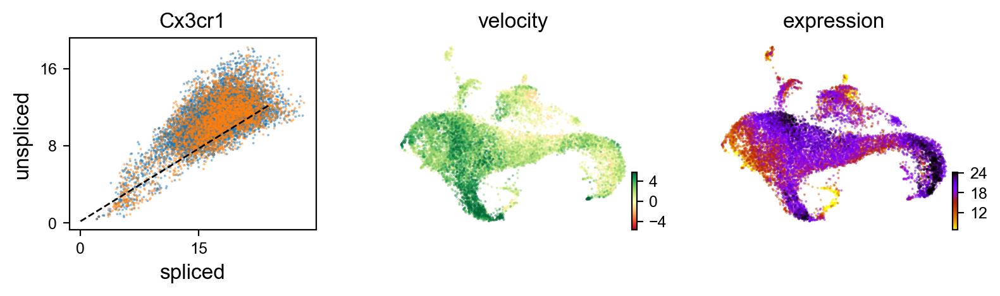

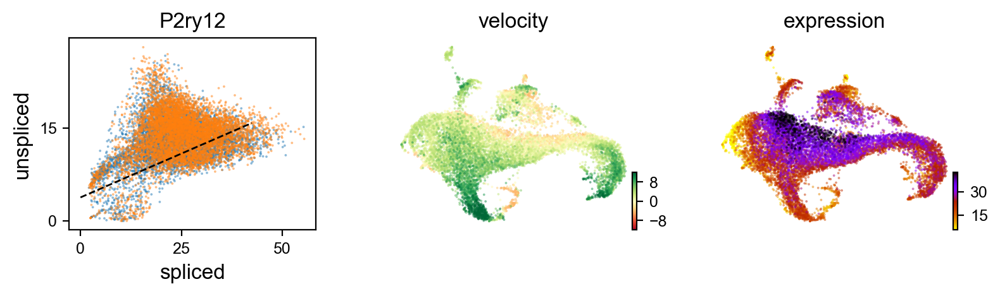

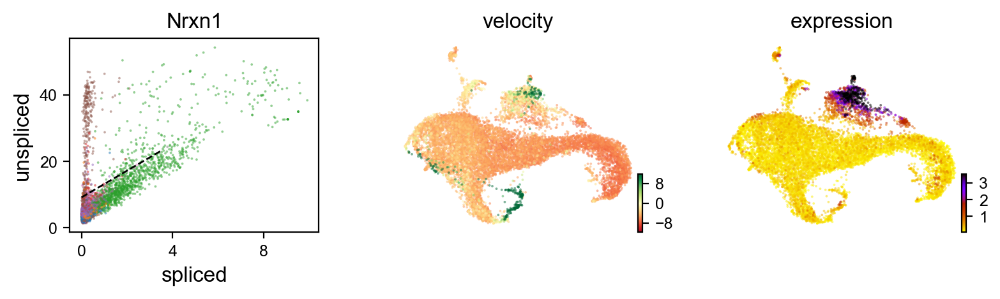

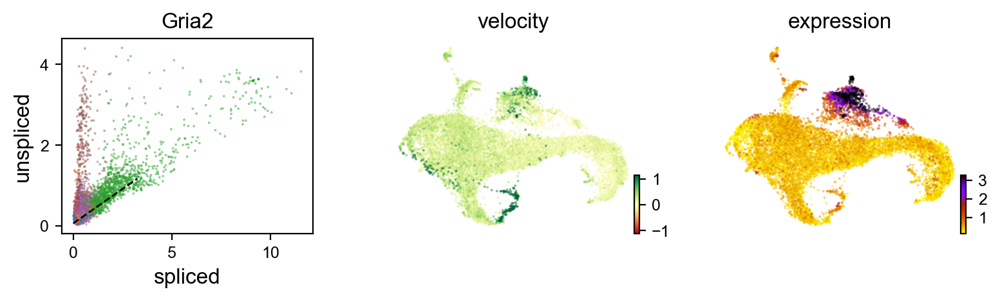

Trying to set attribute `.obs` of view, making a copy.
Trying to set attribute `.obs` of view, making a copy.
Trying to set attribute `.obs` of view, making a copy.
Trying to set attribute `.obs` of view, making a copy.


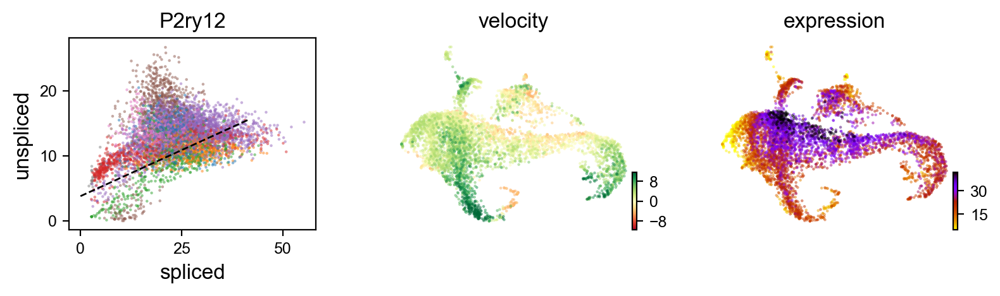

Trying to set attribute `.obs` of view, making a copy.
Trying to set attribute `.obs` of view, making a copy.
Trying to set attribute `.obs` of view, making a copy.
Trying to set attribute `.obs` of view, making a copy.


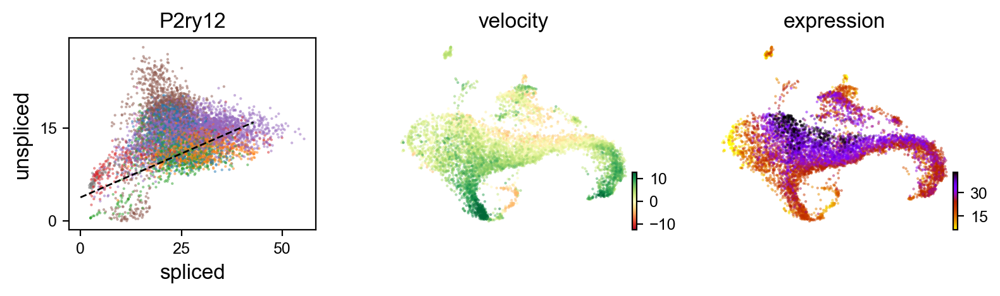

In [40]:
scv.pl.velocity(adata,var_names = "Cx3cr1",show=True,color='condition')
scv.pl.velocity(adata,var_names = "P2ry12",show=True,color = 'age')
scv.pl.velocity(adata,var_names = "Nrxn1",show=True,color = 'finalclusters')
scv.pl.velocity(adata,var_names = "Gria2",show=True,color = 'finalclusters')
scv.pl.velocity(adata[adata.obs["age"] == "P5",:],var_names = "P2ry12",show = True, color = 'finalclusters')
scv.pl.velocity(adata[adata.obs["age"] == "P7",:],var_names = "P2ry12",show = True, color = 'finalclusters')

Trying to set attribute `.obs` of view, making a copy.
Trying to set attribute `.obs` of view, making a copy.
Trying to set attribute `.obs` of view, making a copy.
Trying to set attribute `.obs` of view, making a copy.
Trying to set attribute `.obs` of view, making a copy.
Trying to set attribute `.var` of view, making a copy.
Trying to set attribute `.var` of view, making a copy.


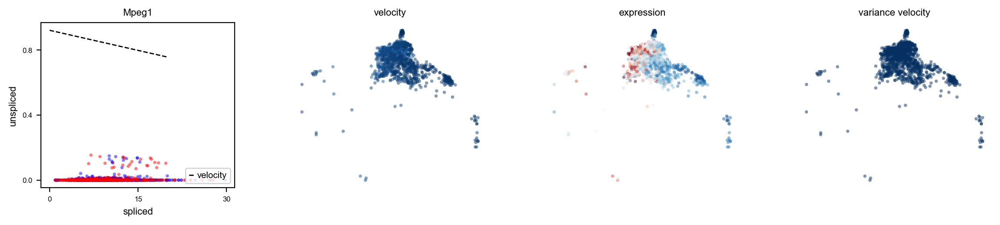

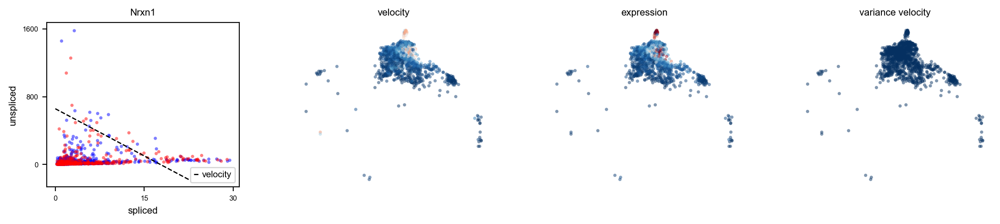

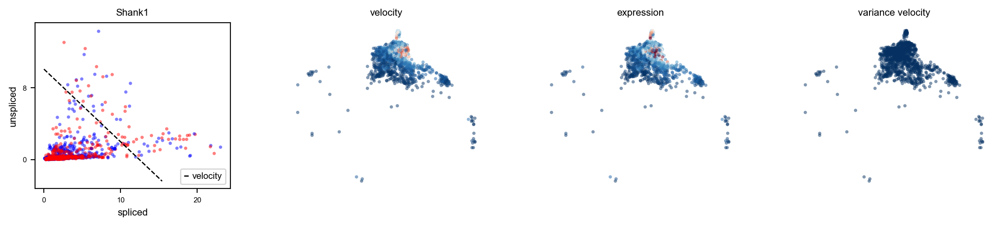

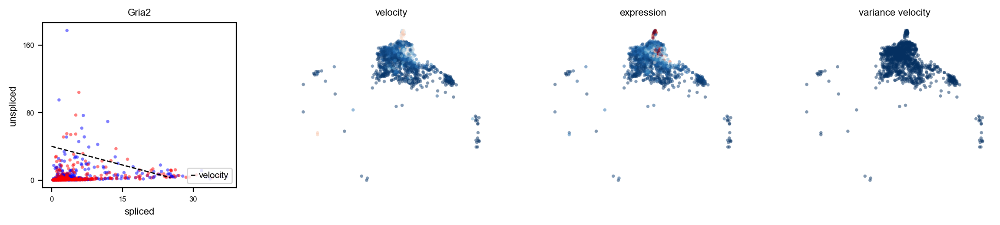

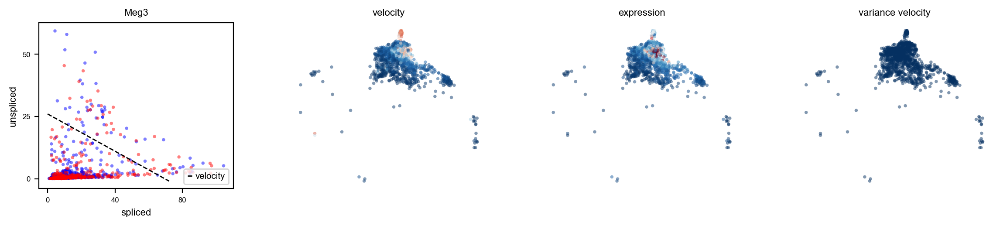

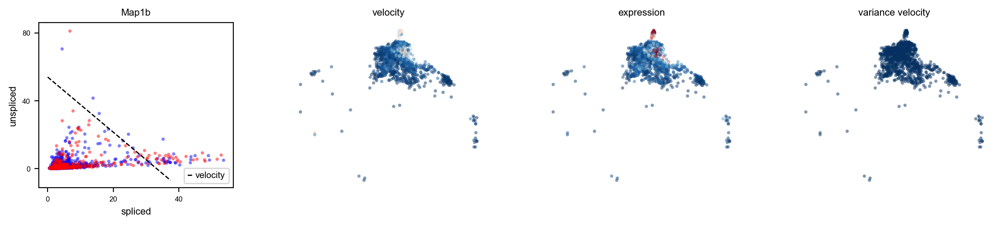

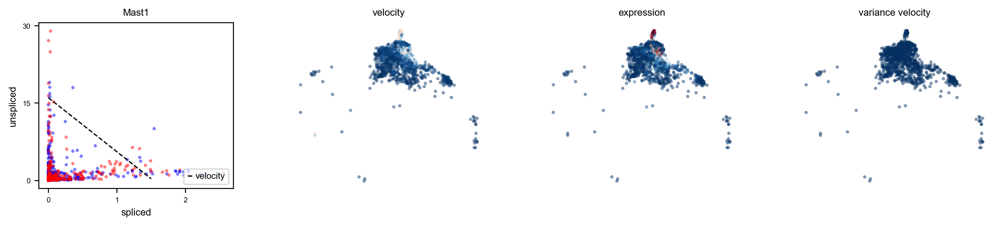

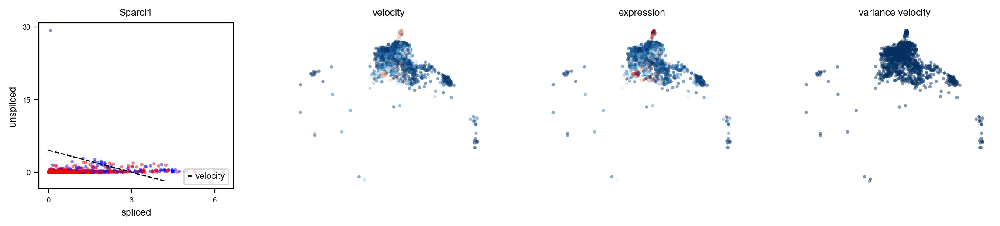

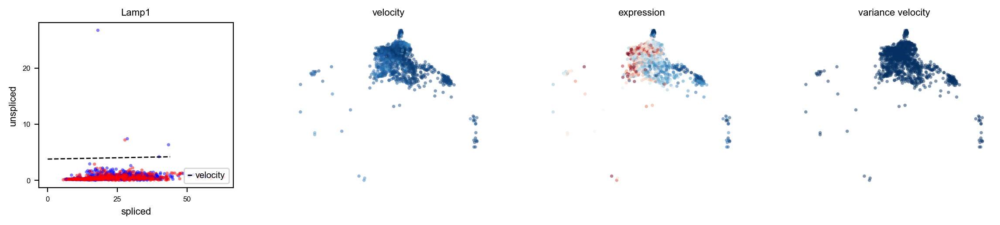

In [153]:
bdata = adata[adata.obs['finalclusters'] == '3,:]

scv.pl.velocity(bdata,var_names = "Mpeg1",show = True, color = 'condition')
scv.pl.velocity(bdata,var_names = "Nrxn1",show = True, color = 'condition')
scv.pl.velocity(bdata,var_names = "Shank1",show = True, color = 'condition')
scv.pl.velocity(bdata,var_names = "Gria2",show = True, color = 'condition')
scv.pl.velocity(bdata,var_names = "Meg3",show = True, color = 'condition')
scv.pl.velocity(bdata,var_names = "Map1b",show = True, color = 'condition')
scv.pl.velocity(bdata,var_names = "Mast1",show = True, color = 'condition')
scv.pl.velocity(bdata,var_names = "Sparcl1",show = True, color = 'condition')
scv.pl.velocity(bdata,var_names = "Lamp1",show = True, color = 'condition')

In [41]:
adata.obs_keys()

['nCount_RNA',
 'percent.mito',
 'age',
 'condition',
 'finalclusters',
 'sample_description',
 'sex',
 'initial_size_unspliced',
 'initial_size_spliced',
 'initial_size',
 'n_counts']

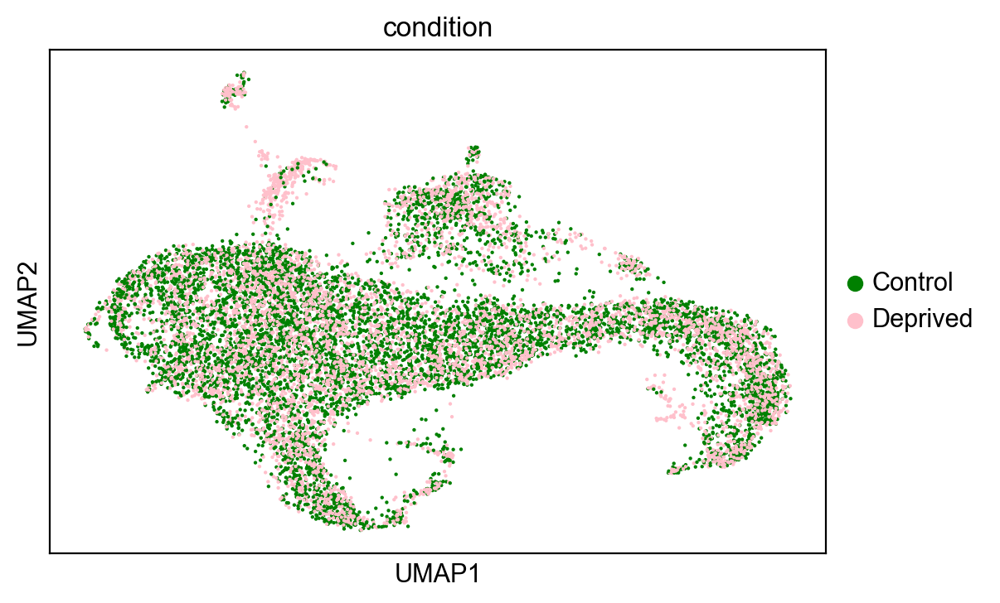

In [42]:
sc.pl.umap(adata,color='condition',palette=['green','pink']) #show umap plot

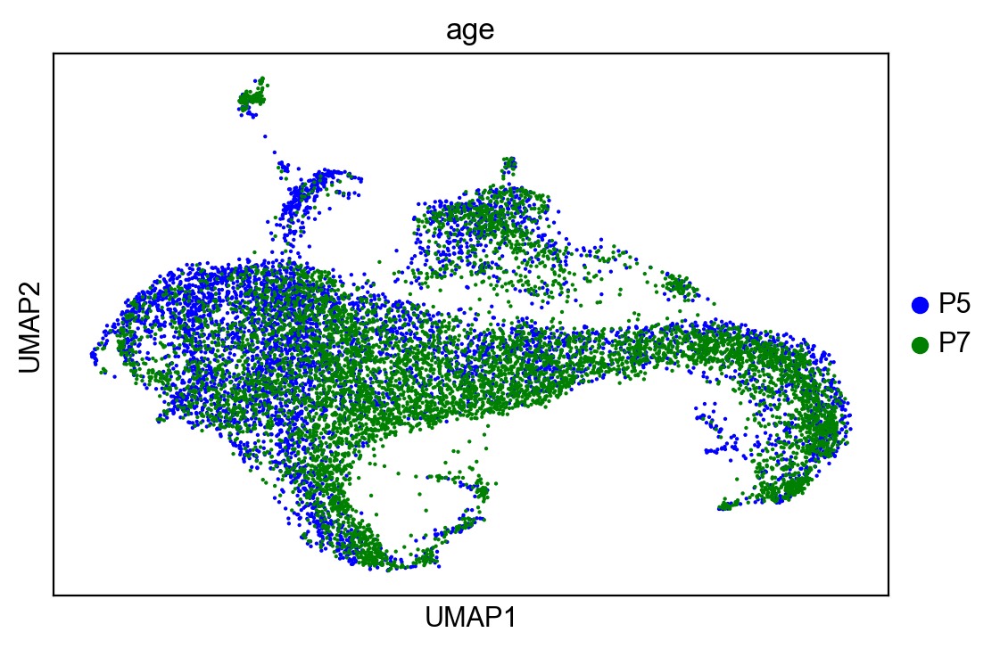

In [43]:
sc.pl.umap(adata,color = 'age',palette=['blue','green']) #show umap

In [44]:
scv.tl.velocity_graph(adata) #compute velocity graph

computing velocity graph
    finished (0:04:52) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


In [45]:
adata.uns

OrderedDict([('neighbors',
              {'params': {'n_neighbors': 30, 'method': 'sklearn'},
               'distances': <12330x12330 sparse matrix of type '<class 'numpy.float64'>'
               	with 369900 stored elements in Compressed Sparse Row format>,
               'connectivities': <12330x12330 sparse matrix of type '<class 'numpy.float64'>'
               	with 527694 stored elements in Compressed Sparse Row format>,
               'indices': array([[ 1283,  1367,  7119, ...,  5022, 12298,  5687],
                      [11967,  2861,   970, ..., 12069,  5306,  5740],
                      [ 4363,  1445,  9297, ...,  2098,  2579,  2829],
                      ...,
                      [10065,  5682,  1291, ...,    34,  8951,   599],
                      [11509, 10593, 11301, ...,  8833,  9547,  3059],
                      [11716, 11936, 11542, ...,  7238,  7130,  5215]])}),
             ('velocity_settings',
              {'mode': 'stochastic', 'fit_offset': True, 'perc':

In [46]:
scv.tl.velocity_embedding(adata, basis='umap') #compute embedding, could use umap or tsne

computing velocity embedding
    finished (0:00:05) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


In [47]:
print(adata)
adata.var['dispersions_norm']

AnnData object with n_obs × n_vars = 12330 × 6000 
    obs: 'nCount_RNA', 'percent.mito', 'age', 'condition', 'finalclusters', 'sample_description', 'sex', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'n_counts', 'velocity_self_transition'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'means', 'dispersions', 'dispersions_norm', 'velocity_offset', 'velocity_offset2', 'velocity_gamma', 'velocity_r2', 'velocity_genes'
    uns: 'neighbors', 'velocity_settings', 'condition_colors', 'age_colors', 'finalclusters_colors', 'velocity_graph', 'velocity_graph_neg'
    obsm: 'X_umap', 'X_pca', 'velocity_umap'
    layers: 'ambiguous', 'matrix', 'spliced', 'unspliced', 'Ms', 'Mu', 'velocity', 'variance_velocity'


Xkr4             0.355730
4732440D04Rik    0.276525
Sntg1            0.420772
Mybl1            0.016871
Vcpip1           0.017175
Tcf24            0.638920
Slco5a1          0.099105
Lactb2           0.020692
Eya1             0.219763
Jph1            -0.030863
Mcm3             1.951630
Kcnq5            0.210333
Rims1            1.345291
Col19a1          5.171349
Adgrb3           1.205845
Bend6            0.339443
Gm37233          0.374517
Gm38336         -0.062271
Neurl3           0.281034
Kansl3          -0.064728
Gm42417          0.098419
Sema4c           0.166584
Mgat4a           0.080582
2010300C02Rik   -0.021018
Rev1            -0.003504
Aff3             0.133666
Lonrf2          -0.018384
Tbc1d8          -0.003017
Rfx8             0.084289
Gm16894          0.388647
                   ...   
Tceal3           0.452735
Plp1             0.702097
Zcchc18          0.812781
Fam199x         -0.034783
Il1rapl2         0.723957
Mum1l1           0.234309
Rnf128           0.017901
Frmpd3      

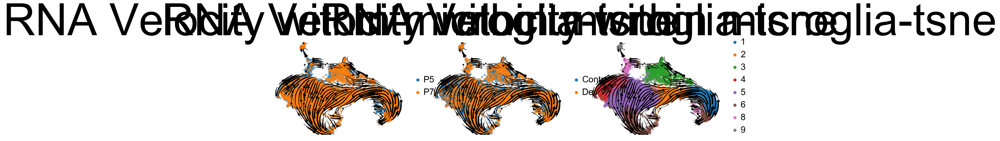

In [48]:
scv.pl.velocity_embedding_stream(adata,
                                 linewidth = 2,
                                 basis = "umap",
                                 color = ['age','condition','finalclusters'],
                                 palette = ['blue','red','black','green','orange','gold','brown','darkgrey'],
                                 alpha=.5,
                                 legend_loc = 'right margin',
                                 legend_fontsize = 20,
                                 title = "RNA Velocity within microglia-tsne",
                                 fontsize = 100
                                 #save = True
                                )

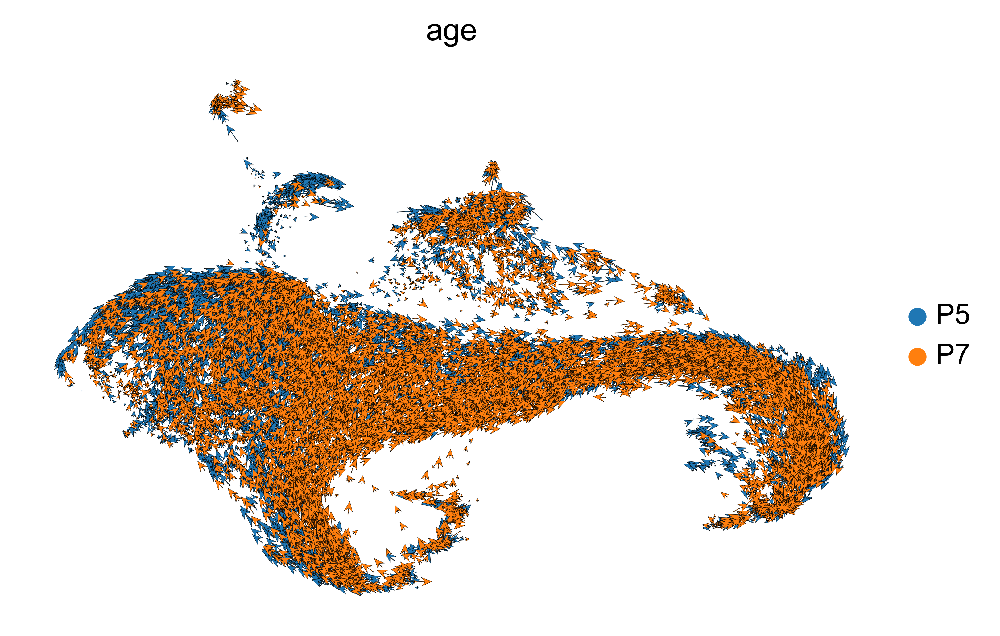

In [49]:
scv.pl.velocity_embedding(adata, basis='umap', legend_loc = 'right margin',color = ['age'],size = 1, arrow_length=8, arrow_size=2, dpi=300)


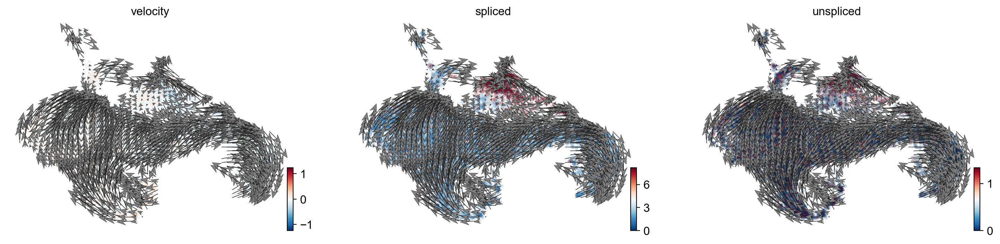

In [50]:
scv.pl.velocity_embedding_grid(adata,
                               color=['Meg3'], 
                               layer=['velocity', 'spliced','unspliced'], 
                               arrow_size=5,
                               arrow_length = 10,
                               alpha = 0.2,
                               perc=95,
                               colorbar=True)

In [51]:
scv.tl.rank_velocity_genes(adata, groupby = 'finalclusters')
adata.uns['rank_velocity_genes']['names']

ranking velocity genes
    finished (0:00:04) --> added 
    'rank_velocity_genes', sorted scores by group ids (adata.uns)


rec.array([('Cdkn3', 'Stmn1', 'Asap2', 'Gm40841', 'Mcm6', 'Siglech', 'H2-T24', 'Ms4a4a'),
           ('Nde1', 'Tk1', 'Sptbn4', 'Ikzf2', 'Inpp4b', 'Sgpl1', 'Usp18', 'Rhoj'),
           ('Numa1', 'Pclaf', 'Jakmip1', 'Pitpnc1', 'Tanc2', 'Camk1d', 'Gm4951', 'Itsn1'),
           ('Cenpe', 'Brip1', 'Sntg1', 'Zdhhc14', 'Mcm3', 'Fyb', 'Znfx1', 'Mndal'),
           ('Arl6ip1', 'Tyms', 'Msi1', 'Klhl3', 'Ldhb', 'Itm2b', 'Oasl1', 'Trps1'),
           ('Ckap2', 'Kntc1', 'Tjp1', 'Mylip', 'Numb', 'Slc6a6', 'Oas2', 'Arhgap15'),
           ('Hmmr', 'Pola1', 'Shank3', 'Dlc1', 'Ctsf', 'Cyp27a1', 'Ranbp2', 'Ctsc'),
           ('Cenpa', 'Zwilch', 'Gnal', 'Malat1', 'Atp8a2', 'Ctsb', 'Ifi206', 'Ifi207'),
           ('Vps13b', 'Cntln', 'Kcnb1', 'Ypel2', 'Ptgs1', 'Gm15892', 'Stat2', 'Psd3'),
           ('Dlgap5', 'Trim37', 'Gpr158', 'Mertk', 'Arhgap5', 'Hist1h2be', 'Timp2', 'Pde7b')],
          dtype=[('1', '<U50'), ('2', '<U50'), ('3', '<U50'), ('4', '<U50'), ('5', '<U50'), ('6', '<U50'), ('8', '<U50'), ('9',

In [52]:
adata.uns

OrderedDict([('neighbors',
              {'params': {'n_neighbors': 30, 'method': 'sklearn'},
               'distances': <12330x12330 sparse matrix of type '<class 'numpy.float64'>'
               	with 369900 stored elements in Compressed Sparse Row format>,
               'connectivities': <12330x12330 sparse matrix of type '<class 'numpy.float64'>'
               	with 527694 stored elements in Compressed Sparse Row format>,
               'indices': array([[ 1283,  1367,  7119, ...,  5022, 12298,  5687],
                      [11967,  2861,   970, ..., 12069,  5306,  5740],
                      [ 4363,  1445,  9297, ...,  2098,  2579,  2829],
                      ...,
                      [10065,  5682,  1291, ...,    34,  8951,   599],
                      [11509, 10593, 11301, ...,  8833,  9547,  3059],
                      [11716, 11936, 11542, ...,  7238,  7130,  5215]])}),
             ('velocity_settings',
              {'mode': 'stochastic',
               'fit_offset'

In [54]:
adata.write("mgAVM02/adata_mgAVM02.h5ad",compression = "gzip")

In [175]:
bdata = scv.read("mgAVM02/adata_mgAVM02.h5ad")
print(bdata.obs_keys(),bdata.var_keys(),bdata.obsm_keys())

['nCount_RNA', 'percent.mito', 'age', 'condition', 'finalclusters', 'sample_description', 'sex', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size', 'n_counts'] ['Accession', 'Chromosome', 'End', 'Start', 'Strand', 'means', 'dispersions', 'dispersions_norm', 'velocity_offset', 'velocity_offset2', 'velocity_gamma', 'velocity_r2', 'velocity_genes', 'velocity_score'] ['X_umap', 'X_pca', 'velocity_umap']


In [176]:
bdata

AnnData object with n_obs × n_vars = 12330 × 5976 
    obs: 'nCount_RNA', 'percent.mito', 'age', 'condition', 'finalclusters', 'sample_description', 'sex', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size', 'n_counts'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'means', 'dispersions', 'dispersions_norm', 'velocity_offset', 'velocity_offset2', 'velocity_gamma', 'velocity_r2', 'velocity_genes', 'velocity_score'
    uns: 'age_colors', 'condition_colors', 'finalclusters_colors', 'neighbors', 'rank_velocity_genes', 'velocity_graph', 'velocity_graph_neg'
    obsm: 'X_umap', 'X_pca', 'velocity_umap'
    layers: 'Ms', 'Mu', 'ambiguous', 'matrix', 'spliced', 'unspliced', 'variance_velocity', 'velocity'